# 臺大空調用電減排效益估計與策略規劃

114-2 環境與能源的資料科學

第三組　邱雲茗、李適軒、楊思柔、呂沐田、李怡慧、黃宗軒

---

## 分析架構

| 部分 | 內容 |
|---|---|
| Part 0 | 資料載入（6棟建物 + 氣象 + 永續辦公室）|
| Part 1 | 探索性分析 EDA（各棟用電趨勢、熱圖、日負載曲線）|
| Part 2 | 冷氣設定溫度推估（冷天基礎扣除法 + 分段線性回歸）|
| Part 3 | 節電效益估算（提高啟動門檻 / 調至政府標準 26°C）|

In [21]:
import warnings
import platform
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
from scipy import stats as scipy_stats
from scipy.optimize import minimize_scalar

warnings.filterwarnings('ignore')

# ── 路徑 ─────────────────────────────────────────────────────────────
CLEANED = Path('cleaned_data')
SUS     = Path('永續辦公室')

# ── 中文字型 ──────────────────────────────────────────────────────────
for font_path in [
    '/Library/Fonts/SourceHanSerif-SemiBold.ttc',
    '/Library/Fonts/NotoSansCJKtc-Regular.otf',
    '/System/Library/Fonts/PingFang.ttc',
]:
    if Path(font_path).exists():
        fm.fontManager.addfont(font_path)
        prop = fm.FontProperties(fname=font_path)
        matplotlib.rcParams['font.family'] = prop.get_name()
        print(f'✓ 字型：{font_path}')
        break
matplotlib.rcParams['axes.unicode_minus'] = False
matplotlib.rcParams['figure.dpi'] = 120

print('環境設定完成')

✓ 字型：/Library/Fonts/SourceHanSerif-SemiBold.ttc
環境設定完成


---
# Part 0 — 資料載入
---

**分析對象共 6 棟建物：**

| 棟別 | 說明 | 資料來源 |
|---|---|---|
| 普通教學館 | 4 子電表加總（高壓空調、新設一、新設二、電梯）| cleaned_data/*.parquet |
| 博雅教學館 | 4 子電表加總（館一、館二、三、四）| cleaned_data/*.parquet |
| 共同教學館 | 單一總表 | cleaned_data/*.parquet |
| 新生教學館 | 單一總表 | cleaned_data/*.parquet |
| 禮賢樓 | 多路子電表加總（total_kw）| cleaned_data/*.parquet |
| 行政大樓 | 多路子電表加總（total_kw）| cleaned_data/*.parquet |

In [22]:
# ── 載入各棟 Parquet ──────────────────────────────────────────────────
def sum_meters(*dfs):
    """對齊時間軸後加總 kw，至少一個非 NaN 才回傳值。"""
    series = [df['kw'].copy() for df in dfs]
    series = [s[~s.index.duplicated(keep='first')] for s in series]
    return pd.concat(series, axis=1).sum(axis=1, min_count=1)

# 四大教學館
df_ac       = pd.read_parquet(CLEANED / 'ac_普通.parquet')
df_putong1  = pd.read_parquet(CLEANED / 'putong1_普通新設一.parquet')
df_putong2  = pd.read_parquet(CLEANED / 'putong2_普通新設二.parquet')
df_elevator = pd.read_parquet(CLEANED / 'elevator_普通電梯.parquet')
df_boya1    = pd.read_parquet(CLEANED / 'boya1_博雅館一.parquet')
df_boya2    = pd.read_parquet(CLEANED / 'boya2_博雅館二.parquet')
df_boya3    = pd.read_parquet(CLEANED / 'boya3_博雅三.parquet')
df_boya4    = pd.read_parquet(CLEANED / 'boya4_博雅四.parquet')
df_gongtong = pd.read_parquet(CLEANED / 'gongtong_共同教室.parquet')
df_xinsheng = pd.read_parquet(CLEANED / 'xinsheng_新生大樓.parquet')

# 新增建物
df_lixi = pd.read_parquet(CLEANED / 'lixian_禮賢樓.parquet')
df_xz   = pd.read_parquet(CLEANED / 'xingzheng_行政大樓.parquet')

# 氣象資料
weather = pd.read_csv(
    CLEANED / 'weather_data_2016_2025.csv',
    parse_dates=['ObsTime'], index_col='ObsTime'
)
weather.index = weather.index.tz_localize(None)
temp = weather['Temperature'].where(lambda x: x > -9).rename('T')

# 永續辦公室
df_basic = pd.read_excel(SUS / '館舍用電基礎值.xlsx')

# ── 組合各棟整棟總用電 ────────────────────────────────────────────────
buildings_kw = {
    '普通教學館': sum_meters(df_ac, df_putong1, df_putong2, df_elevator),
    '博雅教學館': sum_meters(df_boya1, df_boya2, df_boya3, df_boya4),
    '共同教學館': df_gongtong['kw'].copy(),
    '新生教學館': df_xinsheng['kw'].copy(),
    '禮賢樓':    df_lixi['total_kw'].copy(),
    '行政大樓':  df_xz['total_kw'].copy(),
}

# 去除重複索引
buildings_kw = {
    k: s[~s.index.duplicated(keep='first')]
    for k, s in buildings_kw.items()
}

print('=== 各棟用電資料摘要 ===')
print(f'{"棟別":<12} {"有效小時":>10} {"平均 kW":>10} {"峰值 kW":>10} {"資料起始":>12} {"資料結束":>12}')
print('-' * 70)
for name, s in buildings_kw.items():
    valid = s.dropna()
    print(f'{name:<12} {s.notna().sum():>10,} {valid.mean():>10.1f} {valid.max():>10.1f} '
          f'{str(s.index.min().date()):>12} {str(s.index.max().date()):>12}')

print(f'\n氣象資料：{weather.index.min().date()} ~ {weather.index.max().date()}')
print(f'永續辦公室資料：{len(df_basic)} 棟建物')

=== 各棟用電資料摘要 ===
棟別                 有效小時      平均 kW      峰值 kW         資料起始         資料結束
----------------------------------------------------------------------
普通教學館            87,195       39.9      331.6   2016-01-01   2026-01-01
博雅教學館            86,572      113.9      583.5   2016-01-01   2026-01-01
共同教學館            85,709       44.8      248.6   2016-01-01   2026-01-01
新生教學館            87,387       35.9      229.3   2016-01-01   2026-01-01
禮賢樓              56,722     1273.0     8488.1   2019-07-12   2026-01-01
行政大樓             87,567       75.2      289.0   2016-01-01   2026-01-01

氣象資料：2016-01-01 ~ 2025-12-31
永續辦公室資料：145 棟建物


In [23]:
# ── 日型與學期分類 ─────────────────────────────────────────────────────
national_holidays = set([
    '2016-01-01','2016-02-28','2016-02-29','2016-04-04','2016-04-05','2016-06-09','2016-09-15','2016-10-10',
    '2017-01-01','2017-01-02','2017-02-28','2017-04-04','2017-05-30','2017-10-04','2017-10-10',
    '2018-01-01','2018-02-28','2018-04-04','2018-04-05','2018-06-18','2018-09-24','2018-10-10',
    '2019-01-01','2019-02-28','2019-04-04','2019-04-05','2019-06-07','2019-09-13','2019-10-10',
    '2020-01-01','2020-02-28','2020-04-02','2020-04-03','2020-04-04','2020-04-05','2020-06-25',
    '2020-10-01','2020-10-09','2020-10-10','2020-10-11',
    '2021-01-01','2021-02-28','2021-03-01','2021-04-02','2021-04-03','2021-04-04','2021-04-05',
    '2021-06-14','2021-09-21','2021-10-10','2021-10-11',
    '2022-01-01','2022-02-28','2022-04-02','2022-04-03','2022-04-04','2022-04-05','2022-06-03',
    '2022-09-10','2022-10-10',
    '2023-01-01','2023-01-02','2023-02-28','2023-04-01','2023-04-02','2023-04-03','2023-04-04',
    '2023-04-05','2023-06-22','2023-09-29','2023-10-10',
    '2024-01-01','2024-02-28','2024-04-04','2024-04-05','2024-04-06','2024-04-07','2024-06-10',
    '2024-09-17','2024-10-10',
    '2025-01-01','2025-02-28','2025-04-03','2025-04-04','2025-04-05','2025-04-06','2025-05-31',
    '2025-10-06','2025-10-10'
])
cny_holidays = set([
    '2016-02-07','2016-02-08','2016-02-09','2016-02-10','2016-02-11','2016-02-12',
    '2017-01-27','2017-01-28','2017-01-29','2017-01-30','2017-01-31','2017-02-01',
    '2018-02-15','2018-02-16','2018-02-17','2018-02-18','2018-02-19','2018-02-20',
    '2019-02-04','2019-02-05','2019-02-06','2019-02-07','2019-02-08','2019-02-09',
    '2020-01-24','2020-01-25','2020-01-26','2020-01-27','2020-01-28','2020-01-29',
    '2021-02-11','2021-02-12','2021-02-13','2021-02-14','2021-02-15','2021-02-16',
    '2022-01-31','2022-02-01','2022-02-02','2022-02-03','2022-02-04','2022-02-05',
    '2023-01-21','2023-01-22','2023-01-23','2023-01-24','2023-01-25','2023-01-26',
    '2024-02-09','2024-02-10','2024-02-11','2024-02-12','2024-02-13','2024-02-14',
    '2025-01-28','2025-01-29','2025-01-30','2025-01-31','2025-02-01','2025-02-02'
])

def get_day_type(dt):
    d = dt.strftime('%Y-%m-%d')
    if d in cny_holidays:    return 1   # 春節
    if dt.month in [1,7,8] or (dt.month == 2 and dt.day <= 14): return 3  # 寒暑假
    if d in national_holidays or dt.weekday() >= 5:             return 2  # 假日
    return 0   # 上課日

def get_season(dt):
    m, d = dt.month, dt.day
    if m == 1 or (m == 2 and d <= 14):                              return 'winter_break'
    if (m == 2 and d > 14) or m in [3,4,5] or (m == 6 and d <= 20): return 'spring'
    if (m == 6 and d > 20) or m in [7,8]:                           return 'summer_break'
    return 'fall'

# ── 建立主 DataFrame ──────────────────────────────────────────────────
base_df = temp.to_frame(name='T')
base_df['day_type'] = base_df.index.map(get_day_type)
base_df['season']   = base_df.index.map(get_season)
base_df['hour']     = base_df.index.hour
base_df['month']    = base_df.index.month
base_df['year']     = base_df.index.year

for name, s in buildings_kw.items():
    base_df = base_df.join(s.rename(name))

print('主 DataFrame 建立完成，欄位：', base_df.columns.tolist())
print(f'總列數：{len(base_df):,}（{base_df.index.min().date()} ~ {base_df.index.max().date()}）')

主 DataFrame 建立完成，欄位： ['T', 'day_type', 'season', 'hour', 'month', 'year', '普通教學館', '博雅教學館', '共同教學館', '新生教學館', '禮賢樓', '行政大樓']
總列數：87,672（2016-01-01 ~ 2025-12-31）


---
# Part 1 — 探索性分析（EDA）
---

以下各小節對六棟建物分別進行基礎視覺化，了解各棟的用電特性與規律。

## 1-A 年度合計用電量趨勢（2016–2025）

各棟每年用電度數（MWh），用於觀察長期趨勢與異常年份。

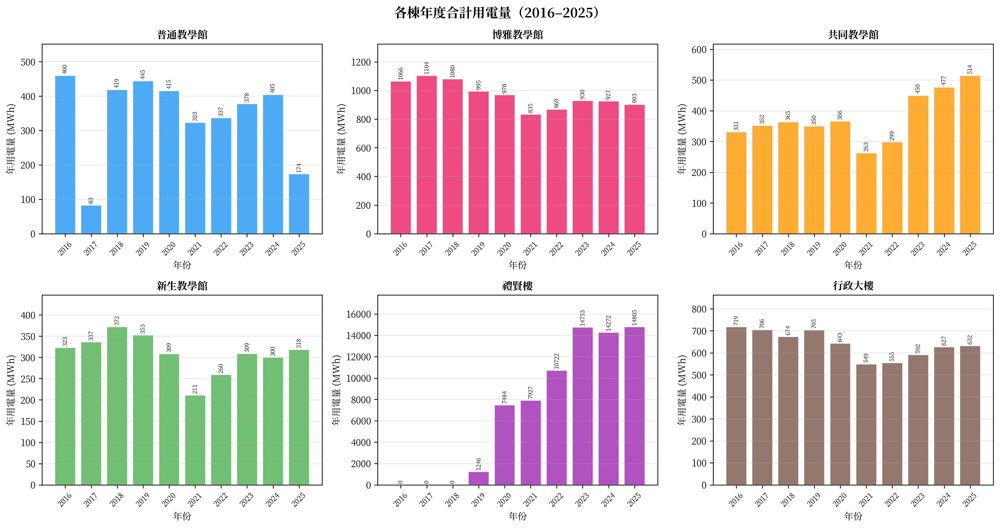

In [24]:
bldg_colors = {
    '普通教學館': '#2196F3',
    '博雅教學館': '#E91E63',
    '共同教學館': '#FF9800',
    '新生教學館': '#4CAF50',
    '禮賢樓':    '#9C27B0',
    '行政大樓':  '#795548',
}

bldg_list = list(buildings_kw.keys())
n_bldg = len(bldg_list)

fig, axes = plt.subplots(2, 3, figsize=(15, 8), dpi=300)
axes = axes.flatten()

for ax, name in zip(axes, bldg_list):
    s = base_df[name]
    annual = s.resample('YE').sum() / 1000  # kWh → MWh
    annual = annual[annual.index.year <= 2025]
    color = bldg_colors[name]
    ax.bar(annual.index.year, annual.values, color=color, alpha=0.8, edgecolor='white')
    for yr, val in zip(annual.index.year, annual.values):
        if not np.isnan(val):
            ax.text(yr, val + annual.max() * 0.01, f'{val:.0f}',
                    ha='center', va='bottom', fontsize=6.5, rotation=90)
    ax.set_title(name, fontsize=11, fontweight='bold')
    ax.set_xlabel('年份')
    ax.set_ylabel('年用電量 (MWh)')
    ax.set_ylim(0, annual.max() * 1.2)
    ax.grid(axis='y', alpha=0.3)
    ax.set_xticks(range(2016, 2026))
    ax.tick_params(axis='x', labelrotation=45, labelsize=8)

plt.suptitle('各棟年度合計用電量（2016–2025）', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(CLEANED / 'report_annual_trend.png', dpi=300, bbox_inches='tight')
plt.show()

## 1-B 月平均功率時序（2016–2025）

以月為單位計算平均功率（kW），顯示各棟的季節週期性與長期趨勢。

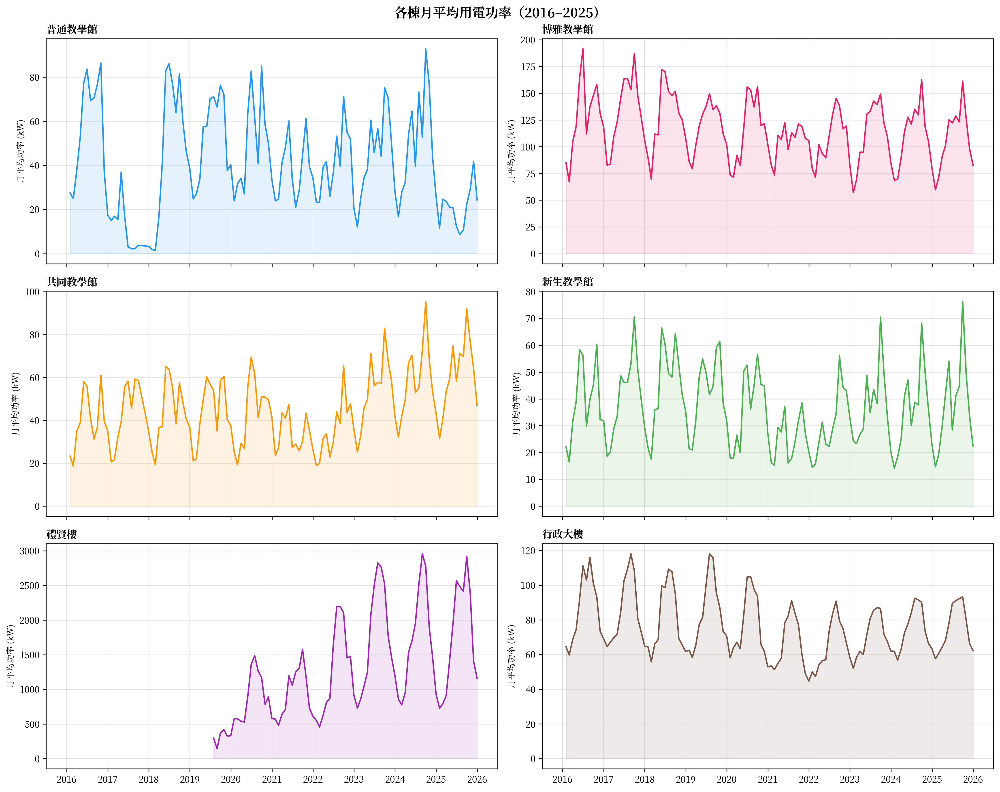

In [25]:
fig, axes = plt.subplots(3, 2, figsize=(15, 12), dpi=300, sharex=True)
axes = axes.flatten()

for ax, name in zip(axes, bldg_list):
    s = base_df[name]
    monthly = s.resample('ME').mean()
    color = bldg_colors[name]
    ax.plot(monthly.index, monthly.values, color=color, lw=1.5)
    ax.fill_between(monthly.index, 0, monthly.values, color=color, alpha=0.12)
    for yr in range(2016, 2026):
        ax.axvline(pd.Timestamp(f'{yr}-01-01'), color='gray', lw=0.5, alpha=0.3)
    ax.set_title(name, fontsize=11, fontweight='bold', loc='left')
    ax.set_ylabel('月平均功率 (kW)', fontsize=9)
    ax.grid(axis='y', alpha=0.3)

plt.suptitle('各棟月平均用電功率（2016–2025）', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(CLEANED / 'report_monthly_trend.png', dpi=300, bbox_inches='tight')
plt.show()

## 1-C 月 × 時 熱圖（平均 kW）

X 軸為月份、Y 軸為時刻，顏色代表該組合的平均功率。
可看出冷氣高峰（夏季白天）與夜間低谷的分佈。

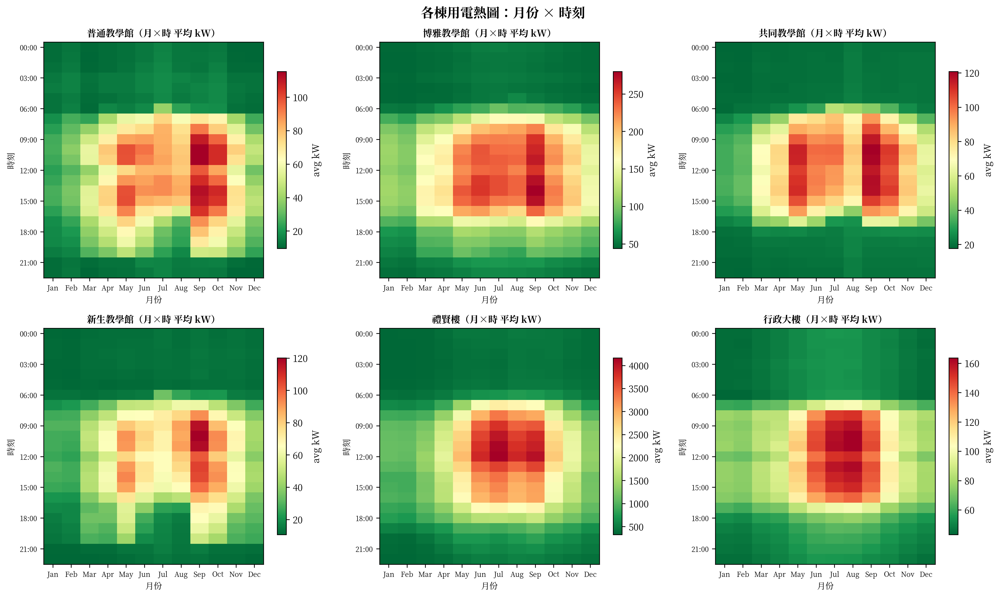

In [26]:
month_labels = ['Jan','Feb','Mar','Apr','May','Jun',
                'Jul','Aug','Sep','Oct','Nov','Dec']

fig, axes = plt.subplots(2, 3, figsize=(15, 9), dpi=300)
axes = axes.flatten()

for ax, name in zip(axes, bldg_list):
    s = base_df[name]
    df_tmp = pd.DataFrame({'kw': s, 'month': s.index.month, 'hour': s.index.hour})
    pivot = df_tmp.groupby(['hour','month'])['kw'].mean().unstack('month')
    im = ax.imshow(pivot.values, aspect='auto', cmap='RdYlGn_r', origin='upper')
    ax.set_xticks(range(12))
    ax.set_xticklabels(month_labels, fontsize=7.5)
    ax.set_yticks(range(0, 24, 3))
    ax.set_yticklabels([f'{h:02d}:00' for h in range(0, 24, 3)], fontsize=7.5)
    ax.set_xlabel('月份', fontsize=9)
    ax.set_ylabel('時刻', fontsize=9)
    ax.set_title(f'{name}（月×時 平均 kW）', fontweight='bold', fontsize=10)
    plt.colorbar(im, ax=ax, shrink=0.75, label='avg kW')

plt.suptitle('各棟用電熱圖：月份 × 時刻', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(CLEANED / 'report_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

## 1-D 日負載曲線（上課日 vs 假日 vs 寒暑假）

以小時為單位計算平均功率，比較三種日型的差異。
上課日峰值明顯高於假日，代表教學與辦公活動對用電的顯著影響。

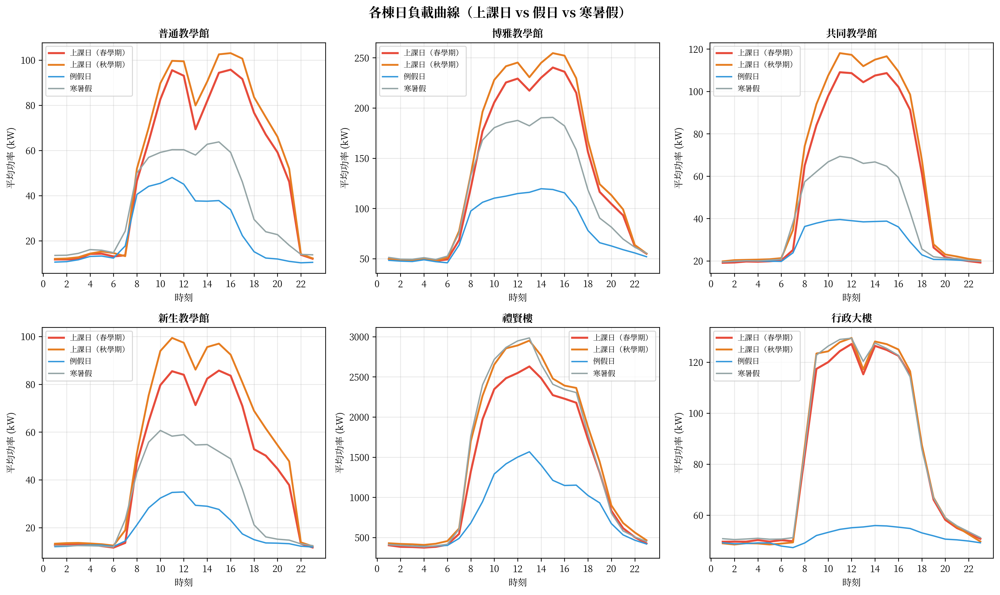

In [27]:
fig, axes = plt.subplots(2, 3, figsize=(15, 9), dpi=300)
axes = axes.flatten()

day_configs = [
    (0, 'spring', '上課日（春學期）',  '#e74c3c', 2.2),
    (0, 'fall',   '上課日（秋學期）',  '#e67e22', 2.0),
    (2,  None,    '例假日',            '#3498db', 1.5),
    (3,  None,    '寒暑假',            '#95a5a6', 1.5),
]

for ax, name in zip(axes, bldg_list):
    s = base_df[name]
    df_tmp = pd.DataFrame({
        'kw':       s,
        'hour':     s.index.hour,
        'day_type': base_df['day_type'],
        'season':   base_df['season'],
    })
    for dt, season_val, label, color, lw in day_configs:
        sub = df_tmp[df_tmp['day_type'] == dt]
        if season_val:
            sub = sub[sub['season'] == season_val]
        curve = sub.groupby('hour')['kw'].mean()
        ax.plot(curve.index, curve.values, label=label, lw=lw, color=color)
    ax.set_title(name, fontsize=11, fontweight='bold')
    ax.set_xlabel('時刻')
    ax.set_ylabel('平均功率 (kW)')
    ax.set_xticks(range(0, 24, 2))
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)

plt.suptitle('各棟日負載曲線（上課日 vs 假日 vs 寒暑假）', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(CLEANED / 'report_load_curve.png', dpi=300, bbox_inches='tight')
plt.show()

## 1-E 整棟用電 vs 室外溫度（全時段預覽）

快速確認各棟用電量與室外溫度的相關性。
若有明顯正相關（高溫時用電增加），代表空調訊號存在，適合進行拐點分析。

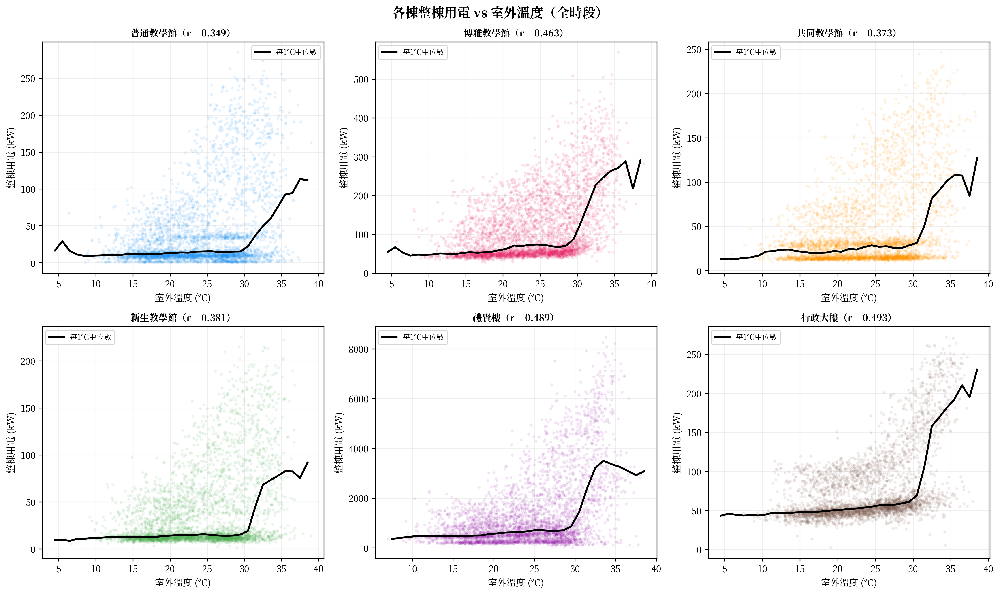

In [47]:
fig, axes = plt.subplots(2, 3, figsize=(15, 9), dpi=300)
axes = axes.flatten()

for ax, name in zip(axes, bldg_list):
    s = base_df[name]
    T = base_df['T'].values
    Y = s.values
    valid = ~(np.isnan(T) | np.isnan(Y))
    # 取樣 4000 點
    samp = np.random.default_rng(42).choice(
        np.where(valid)[0], size=min(4000, valid.sum()), replace=False)
    ax.scatter(T[samp], Y[samp], alpha=0.08, s=5, color=bldg_colors[name])
    # 每 1°C 中位數
    t_v, y_v = T[valid], Y[valid]
    bins = np.arange(int(t_v.min()), int(t_v.max()) + 1, 1.0)
    med, edges, _ = scipy_stats.binned_statistic(t_v, y_v, statistic='median', bins=bins)
    ax.plot((edges[:-1] + edges[1:]) / 2, med, color='black', lw=2, label='每1°C中位數')
    r = pd.Series(t_v).corr(pd.Series(y_v))
    ax.set_title(f'{name}（r = {r:.3f}）', fontweight='bold', fontsize=10)
    ax.set_xlabel('室外溫度 (°C)')
    ax.set_ylabel('整棟用電 (kW)')
    ax.legend(fontsize=8)
    ax.grid(alpha=0.2)

plt.suptitle('各棟整棟用電 vs 室外溫度（全時段）', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(CLEANED / 'report_temp_scatter_all.png', dpi=300, bbox_inches='tight', transparent = True)
plt.show()

## 1-F 用電成分分解（永續辦公室方法）

台大永續辦公室已對全校 145 棟建物進行用電分解，輸出結果儲存於 `館舍用電基礎值.xlsx`。
分解方法（`08_計算館舍不同日子用電值.py`）以**日型**（上課日／上班日／週末／假日）×
**時段**（清晨 ≤6h / 下午 12–18h）× **氣溫層**（冷天 / 熱天）的 75 百分位數，
將整棟小時功率拆解為四個成分：

| 成分 | 定義 |
|---|---|
| **館舍基礎用電** | 任何日型、最低氣溫下的最小負載（燈光、電梯等固定設備）|
| **設備待機用電（含暖季增量）** | 超出基礎的設備常駐待機（含夏天散熱增量）|
| **人員設備使用用電** | 因上課／上班造成的設備開啟增量（電腦、投影機等）|
| **人員空調使用用電** | 因人員活動驅動的空調增量（AC 核心分析對象）|

下圖以四大教學館為例，呈現各成分的絕對值（kW）與比例。

=== 六棟建物用電成分分解（永續辦公室，kW）===
       館舍基礎用電  設備待機用電(+暖季)  人員設備使用用電  人員空調使用用電     合計    面積(m²)
普通教學館    19.0         16.0      51.0     117.0  203.0   8791.35
博雅教學館    26.0          5.0     105.0      94.0  230.0  10743.12
共同教學館    14.0          2.0      55.0     118.0  189.0   5460.55
新生教學館    11.0          1.0      38.0     113.0  163.0   5201.01
禮賢樓      53.0         15.0      68.0     153.0  289.0  15279.27
行政大樓     32.0         11.0      47.0     116.0  206.0   5606.62

=== 各成分佔比 ===
       館舍基礎用電  設備待機用電(+暖季)  人員設備使用用電  人員空調使用用電
普通教學館     9.4          7.9      25.1      57.6
博雅教學館    11.3          2.2      45.7      40.9
共同教學館     7.4          1.1      29.1      62.4
新生教學館     6.7          0.6      23.3      69.3
禮賢樓      18.3          5.2      23.5      52.9
行政大樓     15.5          5.3      22.8      56.3


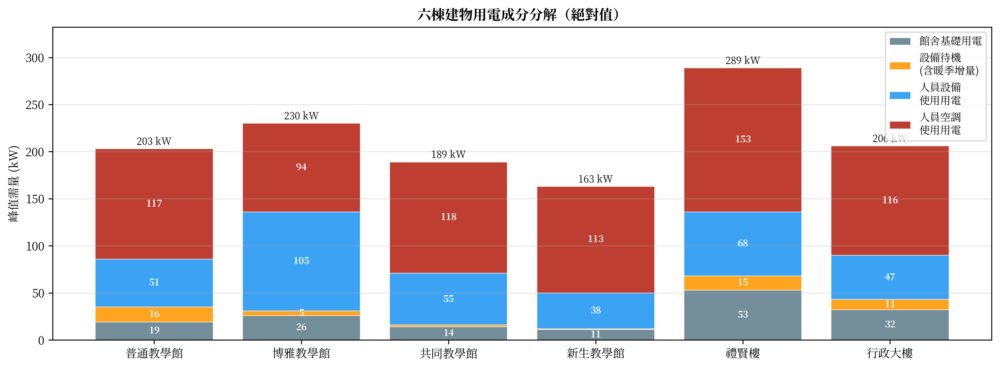

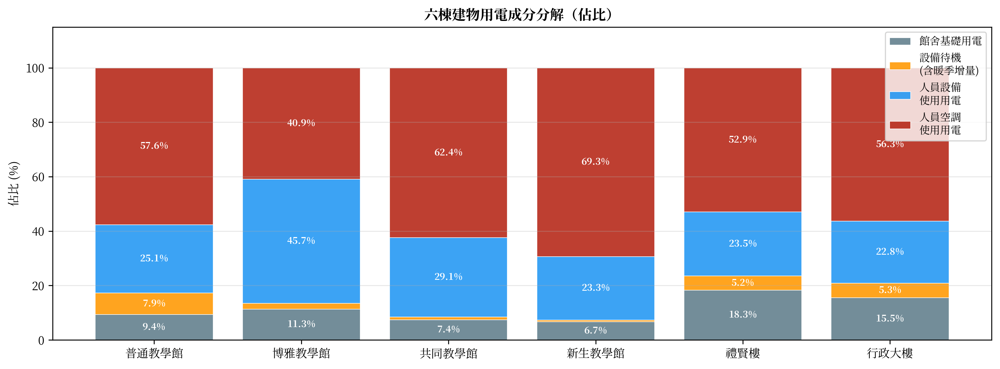

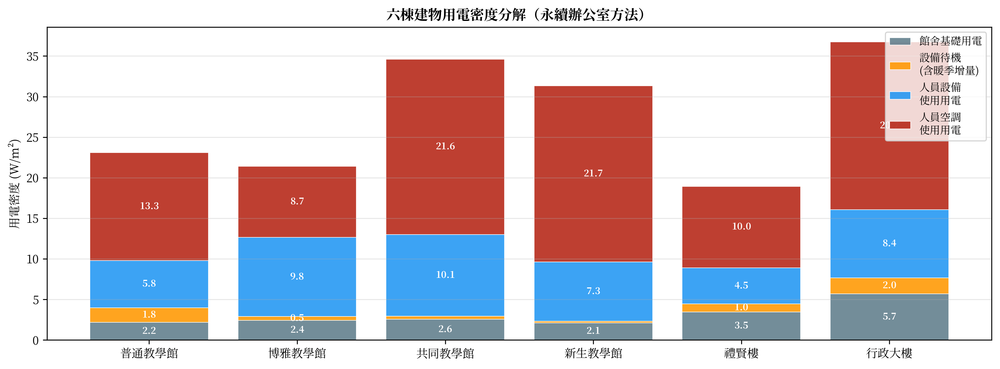

In [46]:
# ── 永續辦公室用電成分分解圖（六棟建物）────────────────────────────────────
# 永續辦公室資料的館舍名稱（精確比對）
hall_exact_names = {
    '普通教學館': '普通教學館',
    '博雅教學館': '博雅教學館',
    '共同教學館': '共同教學館',
    '新生教學館': '新生教學館',
    '禮賢樓':    '禮賢樓(卓聯大樓)',
    '行政大樓':  '行政大樓(含北、南、東西側)',
}

components   = ['館舍基礎用電', '設備待機用電(+暖季)', '人員設備使用用電', '人員空調使用用電']
comp_labels  = ['館舍基礎用電', '設備待機\n(含暖季增量)', '人員設備\n使用用電', '人員空調\n使用用電']
comp_colors  = ['#607D8B', '#FF9800', '#2196F3', "#b52414"]
density_comps = ['館舍基礎用電密度', '設備待機用電密度(+暖季)', '人員設備使用用電密度', '人員空調使用用電密度']

display_names = list(hall_exact_names.keys())

# 從永續辦公室資料取出各棟的各成分值
decomp_data = {}
for disp, exact in hall_exact_names.items():
    row = df_basic[df_basic['館舍名稱'] == exact]
    decomp_data[disp] = {c: int(row[c].values[0]) for c in components}
    decomp_data[disp]['面積(m²)'] = float(row['館舍面積'].values[0])
    for dc in density_comps:
        decomp_data[disp][dc] = float(row[dc].values[0])

df_decomp = pd.DataFrame(decomp_data).T
df_decomp[components] = df_decomp[components].astype(float)
df_decomp['合計'] = df_decomp[components].sum(axis=1)
pct = df_decomp[components].div(df_decomp['合計'], axis=0) * 100

print('=== 六棟建物用電成分分解（永續辦公室，kW）===')
print(df_decomp[components + ['合計', '面積(m²)']].to_string())
print()
print('=== 各成分佔比 ===')
print(pct.round(1).to_string())

# ── 圖一A：用電成分分解（絕對值 kW）─────────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 4.5), dpi=300)
bottoms = np.zeros(n)
for comp, label, color in zip(components, comp_labels, comp_colors):
    vals = df_decomp[comp].values.astype(float)
    bars = ax.bar(x, vals, bottom=bottoms, color=color, alpha=0.88,
                  label=label, edgecolor='white', linewidth=0.5)
    for bar, val, bot in zip(bars, vals, bottoms):
        if val >= 5:
            ax.text(bar.get_x() + bar.get_width() / 2, bot + val / 2,
                    f'{val:.0f}', ha='center', va='center',
                    fontsize=8, fontweight='bold', color='white')
    bottoms += vals

for i, total in enumerate(df_decomp['合計'].values):
    ax.text(i, total + 1.5, f'{total:.0f} kW', ha='center', va='bottom', fontsize=8.5)

ax.set_xticks(x)
ax.set_xticklabels(display_names, fontsize=10)
ax.set_ylabel('峰值需量 (kW)', fontsize=10)
ax.set_ylim(0, df_decomp['合計'].max() * 1.15)
ax.set_title('六棟建物用電成分分解（絕對值）', fontsize=12, fontweight='bold')
ax.legend(loc='upper right', fontsize=9)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(CLEANED / 'report_decomposition_abs.png', dpi=300, bbox_inches='tight', transparent = True)
plt.show()

# ── 圖一B：用電成分分解（佔比 %）────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 4.5), dpi=300)
bottoms = np.zeros(n)
for comp, label, color in zip(components, comp_labels, comp_colors):
    vals = pct[comp].values
    bars = ax.bar(x, vals, bottom=bottoms, color=color, alpha=0.88,
                  label=label, edgecolor='white', linewidth=0.5)
    for bar, val, bot in zip(bars, vals, bottoms):
        if val >= 3.5:
            ax.text(bar.get_x() + bar.get_width() / 2, bot + val / 2,
                    f'{val:.1f}%', ha='center', va='center',
                    fontsize=8, fontweight='bold', color='white')
    bottoms += vals

ax.set_xticks(x)
ax.set_xticklabels(display_names, fontsize=10)
ax.set_ylabel('佔比 (%)', fontsize=10)
ax.set_ylim(0, 115)
ax.set_title('六棟建物用電成分分解（佔比）', fontsize=12, fontweight='bold')
ax.legend(loc='upper right', fontsize=9)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(CLEANED / 'report_decomposition_pct.png', dpi=300, bbox_inches='tight', transparent = True)
plt.show()

# ── 圖二：用電密度（W/m²）比較 ──────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 4.5), dpi=300)
bottoms = np.zeros(n)
for comp, label, color in zip(density_comps, comp_labels, comp_colors):
    vals = df_decomp[comp].values.astype(float) * 1000  # kW/m² → W/m²
    bars = ax.bar(x, vals, bottom=bottoms, color=color, alpha=0.88,
                  label=label, edgecolor='white', linewidth=0.5)
    for bar, val, bot in zip(bars, vals, bottoms):
        if val >= 0.4:
            ax.text(bar.get_x() + bar.get_width() / 2, bot + val / 2,
                    f'{val:.1f}', ha='center', va='center',
                    fontsize=8, fontweight='bold', color='white')
    bottoms += vals

ax.set_xticks(x)
ax.set_xticklabels(display_names, fontsize=10)
ax.set_ylabel('用電密度 (W/m²)', fontsize=10)
ax.set_title('六棟建物用電密度分解（永續辦公室方法）', fontsize=12, fontweight='bold')
ax.legend(loc='upper right', fontsize=9)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(CLEANED / 'report_decomposition_density.png', dpi=300, bbox_inches='tight')
plt.show()

---
# Part 2 — 冷氣設定溫度推估（拐點法）
---

## 方法：冷天基礎扣除法

```
整棟總用電 = 非AC基礎負載 + AC冷氣負載

非AC基礎負載：上課日 × 上課時段（08–21h）× T_outdoor < 20°C → 中位數 kW
    → 冬天冷天幾乎不開冷氣，此時的用電代表燈光、電腦等固定設備

AC_proxy = 整棟總用電 − 非AC基礎負載

對 AC_proxy vs T_outdoor 做分段線性回歸 → 找 RSS 最小的拐點 T*
```

**拐點詮釋：** T* 為室外溫度啟動門檻（冷氣開始大量運作的氣溫），
並非室內設定溫度。室內設定溫度 ≈ T* + 建物室內熱增量（約 1–3°C）。
政府標準為 **室內 26°C**，因此室外啟動門檻理應在 26°C 以下。

In [30]:
# ── 計算冷天基礎負載 ───────────────────────────────────────────────────
COLD_THRESH = 20.0

cold_mask = (
    (base_df['day_type'] == 0) &
    (base_df['hour'].between(8, 21)) &
    (base_df['T'] < COLD_THRESH) &
    (base_df['T'] > 0)
)

baselines = {}
print(f'=== 各棟冷天基礎負載（上課日、08–21h、T < {COLD_THRESH}°C）===')
print(f'{"棟別":<12} {"中位數(kW)":>12} {"樣本數":>10}')
print('-' * 38)
for name in bldg_list:
    cold_data = base_df.loc[cold_mask, name].dropna()
    baseline  = cold_data.median()
    baselines[name] = baseline
    print(f'{name:<12} {baseline:>12.1f} {len(cold_data):>10,}')

# 建立 AC proxy 欄位
for name in bldg_list:
    base_df[f'{name}_proxy'] = base_df[name] - baselines[name]

print('\nAC proxy = 整棟用電 − 冷天基礎負載，已計算完成。')

=== 各棟冷天基礎負載（上課日、08–21h、T < 20.0°C）===
棟別                中位數(kW)        樣本數
--------------------------------------
普通教學館                38.5      5,223
博雅教學館               130.6      5,061
共同教學館                46.1      5,122
新生教學館                40.1      5,211
禮賢樓                 994.0      3,447
行政大樓                 81.5      5,226

AC proxy = 整棟用電 − 冷天基礎負載，已計算完成。


## 2-B 分段線性回歸推估設定溫度

篩選條件：**上課日 × 上課時段（08–21h）× 暖月（3–10月）× 春/秋學期（排除暑假）**  
對 20–30°C 搜尋 RSS 最小的轉折點 T*。

In [31]:
def piecewise_rss(t_break, T, Y):
    rss = 0.0
    for mask in [T <= t_break, T > t_break]:
        if mask.sum() < 3: return np.inf
        s, i, *_ = scipy_stats.linregress(T[mask], Y[mask])
        rss += ((Y[mask] - (s * T[mask] + i)) ** 2).sum()
    return rss

def estimate_t_set(T_arr, Y_arr, t_min=20.0, t_max=30.0):
    valid = ~(np.isnan(T_arr) | np.isnan(Y_arr))
    T, Y  = T_arr[valid], Y_arr[valid]
    if len(T) < 30: return np.nan, np.nan, np.nan, len(T)
    res   = minimize_scalar(
        piecewise_rss, bounds=(t_min, t_max), method='bounded', args=(T, Y))
    t_set = res.x
    def r2(mask):
        if mask.sum() < 2: return np.nan
        _, _, r, *_ = scipy_stats.linregress(T[mask], Y[mask])
        return r**2
    return t_set, r2(T <= t_set), r2(T > t_set), len(T)

# 分析條件：上課日 × 上課時段 × 暖月（3–10月）× 春/秋學期
analysis_mask = (
    (base_df['day_type'] == 0) &
    (base_df['hour'].between(8, 21)) &
    (base_df['month'].between(3, 10)) &
    (base_df['season'].isin(['spring', 'fall'])) &
    (base_df['T'].notna()) & (base_df['T'] > 0)
)

seasons_cfg = {
    '全年（春+秋）':    None,
    '下學期（2–6月）':  'spring',
    '上學期（9–12月）': 'fall',
}

# 執行各棟各季的拐點推估
results = {}
for name in bldg_list:
    results[name] = {}
    for season_label, season_val in seasons_cfg.items():
        sub = base_df[analysis_mask] if season_val is None \
              else base_df[analysis_mask & (base_df['season'] == season_val)]
        T = sub['T'].values
        Y = sub[f'{name}_proxy'].values
        t_set, r2l, r2r, n = estimate_t_set(T, Y)
        results[name][season_label] = {'T_set': t_set, 'R²左': r2l, 'R²右': r2r, 'n': n}

print('=== 各棟拐點推估結果 ===')
print(f'{"棟別":<12} {"全年（春+秋）":>14} {"下學期（2–6月）":>16} {"上學期（9–12月）":>17}')
print('-' * 65)
for name in bldg_list:
    fy = results[name]['全年（春+秋）']['T_set']
    sp = results[name]['下學期（2–6月）']['T_set']
    fa = results[name]['上學期（9–12月）']['T_set']
    print(f'{name:<12} {fy:>12.1f}°C {sp:>14.1f}°C {fa:>15.1f}°C')

=== 各棟拐點推估結果 ===
棟別                  全年（春+秋）        下學期（2–6月）        上學期（9–12月）
-----------------------------------------------------------------
普通教學館                24.5°C           23.8°C            28.0°C
博雅教學館                28.8°C           24.6°C            28.9°C
共同教學館                20.9°C           21.8°C            28.0°C
新生教學館                21.6°C           21.3°C            28.0°C
禮賢樓                  25.3°C           23.5°C            26.1°C
行政大樓                 28.0°C           27.6°C            29.1°C


## 2-C 散佈圖視覺化（AC proxy vs 室外溫度）

左欄：下學期（2–6月）　右欄：上學期（9–12月）  
各列為一棟建物。橘線為每 0.5°C 中位數，金色虛線為推估拐點。

> 下學期溫度從低往高、冷氣從關到開，訊號最清晰，拐點最可信。

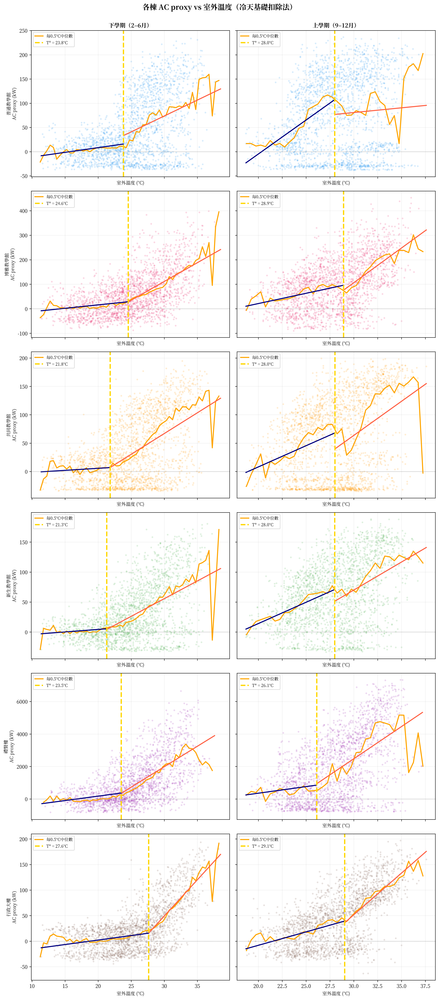

In [48]:
season_vals  = {'下學期（2–6月）': 'spring', '上學期（9–12月）': 'fall'}
seasons_plot = list(season_vals.keys())

fig, axes = plt.subplots(n_bldg, 2, figsize=(12, 4.5 * n_bldg), dpi=300,
                         sharey='row', sharex='col')

for row, name in enumerate(bldg_list):
    proxy_col = f'{name}_proxy'
    for col, season_label in enumerate(seasons_plot):
        ax = axes[row][col]
        season_val = season_vals[season_label]
        sub  = base_df[analysis_mask & (base_df['season'] == season_val)]
        T    = sub['T'].values
        Y    = sub[proxy_col].values
        t_set = results[name][season_label]['T_set']

        # 散點（取樣 2000）
        valid_idx = np.where(~(np.isnan(T) | np.isnan(Y)))[0]
        if len(valid_idx) > 0:
            samp = np.random.default_rng(42).choice(
                valid_idx, size=min(2000, len(valid_idx)), replace=False)
            ax.scatter(T[samp], Y[samp], alpha=0.12, s=6, color=bldg_colors[name])

        # 每 0.5°C 中位數
        valid = ~(np.isnan(T) | np.isnan(Y))
        if valid.sum() > 20:
            bins = np.arange(int(T[valid].min()), int(T[valid].max()) + 1, 0.5)
            med, edges, _ = scipy_stats.binned_statistic(
                T[valid], Y[valid], statistic='median', bins=bins)
            ax.plot((edges[:-1] + edges[1:]) / 2, med,
                    color='orange', lw=2, label='每0.5°C中位數')

        # 兩段回歸線
        if not np.isnan(t_set):
            Tv, Yv = T[valid], Y[valid]
            for seg, c in [(Tv <= t_set, 'navy'), (Tv > t_set, 'tomato')]:
                if seg.sum() >= 2:
                    s_, i_, *_ = scipy_stats.linregress(Tv[seg], Yv[seg])
                    xs = np.linspace(Tv[seg].min(), Tv[seg].max(), 100)
                    ax.plot(xs, s_ * xs + i_, color=c, lw=2)
            ax.axvline(t_set, color='gold', lw=2.5, linestyle='--',
                       label=f'T* = {t_set:.1f}°C')

        ax.axhline(0, color='gray', lw=0.8, linestyle=':')
        ax.legend(fontsize=8, loc='upper left')
        if row == 0:
            ax.set_title(season_label, fontsize=11, fontweight='bold')
        if col == 0:
            ax.set_ylabel(f'{name}\nAC proxy (kW)', fontsize=9)
        ax.set_xlabel('室外溫度 (°C)', fontsize=9)
        ax.grid(alpha=0.2)

plt.suptitle('各棟 AC proxy vs 室外溫度（冷天基礎扣除法）', fontsize=14, fontweight='bold', y=1.0)
plt.tight_layout(rect=[0, 0, 1, 1])
plt.savefig(CLEANED / 'report_setpoint_scatter.png', dpi=300, bbox_inches='tight', transparent = True)
plt.show()

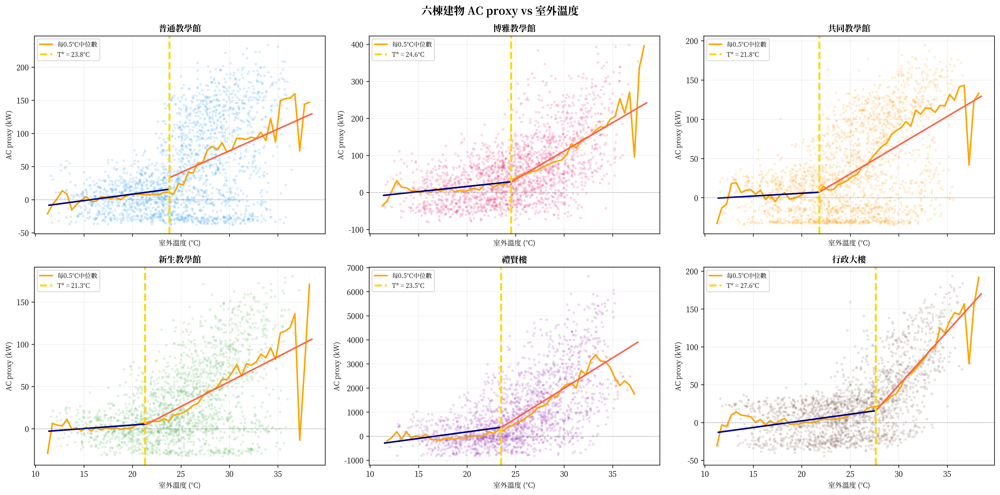

In [50]:
fig, axes = plt.subplots(2, 3, figsize=(18, 9), dpi=300, sharey=False, sharex=True)
axes_flat = axes.flatten()  # 左上到右下：row0=[bldg0,1,2], row1=[bldg3,4,5]

season_label = '下學期（2–6月）'
season_val   = 'spring'

for idx, name in enumerate(bldg_list):
    ax = axes_flat[idx]
    proxy_col = f'{name}_proxy'
    sub = base_df[analysis_mask & (base_df['season'] == season_val)]
    T   = sub['T'].values
    Y   = sub[proxy_col].values
    t_set = results[name][season_label]['T_set']

    # 散點（取樣 2000）
    valid_idx = np.where(~(np.isnan(T) | np.isnan(Y)))[0]
    if len(valid_idx) > 0:
        samp = np.random.default_rng(42).choice(
            valid_idx, size=min(2000, len(valid_idx)), replace=False)
        ax.scatter(T[samp], Y[samp], alpha=0.12, s=6, color=bldg_colors[name])

    # 每 0.5°C 中位數
    valid = ~(np.isnan(T) | np.isnan(Y))
    if valid.sum() > 20:
        bins = np.arange(int(T[valid].min()), int(T[valid].max()) + 1, 0.5)
        med, edges, _ = scipy_stats.binned_statistic(
            T[valid], Y[valid], statistic='median', bins=bins)
        ax.plot((edges[:-1] + edges[1:]) / 2, med,
                color='orange', lw=2, label='每0.5°C中位數')

    # 兩段回歸線
    if not np.isnan(t_set):
        Tv, Yv = T[valid], Y[valid]
        for seg, c in [(Tv <= t_set, 'navy'), (Tv > t_set, 'tomato')]:
            if seg.sum() >= 2:
                s_, i_, *_ = scipy_stats.linregress(Tv[seg], Yv[seg])
                xs = np.linspace(Tv[seg].min(), Tv[seg].max(), 100)
                ax.plot(xs, s_ * xs + i_, color=c, lw=2)
        ax.axvline(t_set, color='gold', lw=2.5, linestyle='--',
                   label=f'T* = {t_set:.1f}°C')

    ax.axhline(0, color='gray', lw=0.8, linestyle=':')
    ax.legend(fontsize=8, loc='upper left')
    ax.set_title(name, fontsize=11, fontweight='bold')
    ax.set_ylabel('AC proxy (kW)', fontsize=9)
    ax.set_xlabel('室外溫度 (°C)', fontsize=9)
    ax.grid(alpha=0.2)

plt.suptitle('六棟建物 AC proxy vs 室外溫度',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(CLEANED / 'report_setpoint_scatter.png', dpi=300,
            bbox_inches='tight', transparent=True)
plt.show()

## 2-D R² 詳細報告

R² 用來判斷拐點的可信度。兩段的 R² 越高，分段線性模型擬合越好，拐點越可信。  
若 R² 偏低，代表整棟用電包含較多非空調負載的雜訊（如大型機房、廚房等），
拐點仍可反映趨勢，但估計不確定性較大。

In [33]:
r2_rows = []
for name in bldg_list:
    for season_label, info in results[name].items():
        r2_rows.append({
            '棟別': name,
            '學期': season_label,
            'T* (°C)': round(info['T_set'], 1) if not np.isnan(info.get('T_set', np.nan)) else np.nan,
            'R²(低溫段)': round(info['R²左'], 3) if not np.isnan(info.get('R²左', np.nan)) else np.nan,
            'R²(高溫段)': round(info['R²右'], 3) if not np.isnan(info.get('R²右', np.nan)) else np.nan,
            'n (小時)': info['n'],
        })

df_r2 = pd.DataFrame(r2_rows)
print('=== 各棟拐點推估 R² 報告 ===')
print(df_r2.to_string(index=False))

=== 各棟拐點推估 R² 報告 ===
   棟別         學期  T* (°C)  R²(低溫段)  R²(高溫段)  n (小時)
普通教學館    全年（春+秋）     24.5    0.068    0.021   16562
普通教學館  下學期（2–6月）     23.8    0.034    0.078   10759
普通教學館 上學期（9–12月）     28.0    0.157    0.002    5803
博雅教學館    全年（春+秋）     28.8    0.120    0.177   16474
博雅教學館  下學期（2–6月）     24.6    0.028    0.232   10665
博雅教學館 上學期（9–12月）     28.9    0.055    0.213    5809
共同教學館    全年（春+秋）     20.9    0.001    0.163   16287
共同教學館  下學期（2–6月）     21.8    0.004    0.185   10487
共同教學館 上學期（9–12月）     28.0    0.067    0.097    5800
新生教學館    全年（春+秋）     21.6    0.026    0.177   16583
新生教學館  下學期（2–6月）     21.3    0.012    0.189   10780
新生教學館 上學期（9–12月）     28.0    0.106    0.097    5803
  禮賢樓    全年（春+秋）     25.3    0.081    0.212   10579
  禮賢樓  下學期（2–6月）     23.5    0.050    0.273    6481
  禮賢樓 上學期（9–12月）     26.1    0.012    0.197    4098
 行政大樓    全年（春+秋）     28.0    0.081    0.338   16578
 行政大樓  下學期（2–6月）     27.6    0.059    0.372   10765
 行政大樓 上學期（9–12月）     29.1    0.103    0.289

## 2-E 各棟拐點溫度比較圖

以下學期（2–6月）的拐點為主要比較指標，並標注政府標準 26°C。  
低於 26°C 表示在氣溫達標準前已開機，顯示存在節電空間。

=== 各棟冷氣室外啟動門檻比較 ===
   棟別    下學期 T*    上學期 T*  差距（26°C）
普通教學館 23.819666 28.001303       2.2
博雅教學館 24.553316 28.932037       1.4
共同教學館 21.819957 28.023689       4.2
新生教學館 21.301832 28.002102       4.7
  禮賢樓 23.501674 26.127953       2.5
 行政大樓 27.639073 29.053428      -1.6

六棟平均下學期 T*：23.8°C
與 26°C 標準平均差距：2.2°C


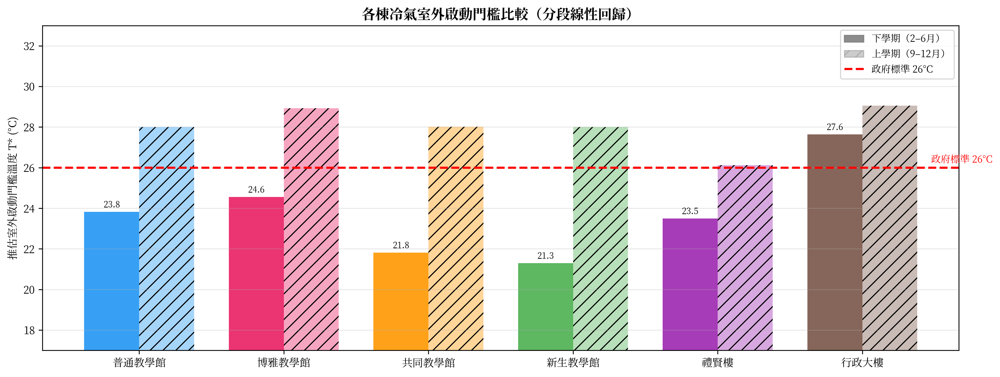

In [51]:
from matplotlib.patches import Patch

compare_data = []
for name in bldg_list:
    sp = results[name]['下學期（2–6月）']['T_set']
    fa = results[name]['上學期（9–12月）']['T_set']
    compare_data.append({'棟別': name, '下學期 T*': sp, '上學期 T*': fa})

df_compare = pd.DataFrame(compare_data)
df_compare['差距（26°C）'] = (26.0 - df_compare['下學期 T*']).round(1)

print('=== 各棟冷氣室外啟動門檻比較 ===')
print(df_compare.to_string(index=False))
print(f'\n六棟平均下學期 T*：{df_compare["下學期 T*"].mean():.1f}°C')
print(f'與 26°C 標準平均差距：{df_compare["差距（26°C）"].mean():.1f}°C')

# 圖表
fig, ax = plt.subplots(figsize=(13, 5), dpi=300)
x = np.arange(n_bldg)
w = 0.38

bars_sp = ax.bar(x - w/2, df_compare['下學期 T*'], w,
                 color=[bldg_colors[n] for n in bldg_list], alpha=0.9, label='_')
bars_fa = ax.bar(x + w/2, df_compare['上學期 T*'], w,
                 color=[bldg_colors[n] for n in bldg_list], alpha=0.4, hatch='//', label='_')

ax.axhline(26, color='red', lw=2, linestyle='--')
ax.text(n_bldg - 0.1, 26.25, '政府標準 26°C', color='red', fontsize=9, ha='right')

for bar in bars_sp:
    h = bar.get_height()
    if not np.isnan(h):
        ax.text(bar.get_x() + bar.get_width()/2, h + 0.1,
                f'{h:.1f}', ha='center', va='bottom', fontsize=8)

ax.set_xticks(x)
ax.set_xticklabels(bldg_list, fontsize=10)
ax.set_ylabel('推估室外啟動門檻溫度 T* (°C)', fontsize=10)
ax.set_ylim(17, 33)
ax.set_title('各棟冷氣室外啟動門檻比較（分段線性回歸）', fontsize=13, fontweight='bold')

legend_handles = [
    Patch(color='gray', alpha=0.9, label='下學期（2–6月）'),
    Patch(color='gray', alpha=0.4, hatch='//', label='上學期（9–12月）'),
    plt.Line2D([0],[0], color='red', lw=2, linestyle='--', label='政府標準 26°C'),
]
ax.legend(handles=legend_handles, fontsize=9)
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(CLEANED / 'report_t_set_comparison.png', dpi=500, bbox_inches='tight', transparent=True)
plt.show()

---
# Part 3 — 節電效益估算
---

## 計算框架

使用**冷卻度時（Cooling Degree Hours, CDH）比例法**估算節電潛力：

$$\text{節電比例}(\Delta T) = 1 - \frac{\mathrm{CDH}(T^* + \Delta T)}{\mathrm{CDH}(T^*)}$$

其中 $\mathrm{CDH}(T) = \sum \max(0,\ T_{\text{outdoor}} - T)$（上課日、08–21h、春+秋學期）

**空調負載（kW）** 來自永續辦公室「館舍用電基礎值.xlsx」的`人員空調使用用電`欄位；
若無對應資料，以 AC proxy 均值作為保守下界。

---
### 兩種政策情境

| 情境 | 說明 | 計算方式 |
|---|---|---|
| **政策一：延後開機**（提升啟動門檻） | 現行 T* → T* + ΔT（ΔT = 1 / 2 / 3°C）| CDH(T* + ΔT) vs CDH(T*)|
| **政策二：調至政府標準** | 現行 T* → 26°C（一次性目標）| CDH(26) vs CDH(T*)|

In [54]:
TARIFF   = 3.5    # 元/kWh（台電高壓平均）
EMISSION = 0.466  # kg CO₂e/kWh（能源署 2025）

# 永續辦公室：各棟空調負載
sus_kw_map = {
    '普通教學館': ('普通',     None),   # 搜尋關鍵字, 精確館舍名稱
    '博雅教學館': ('博雅',     None),
    '共同教學館': ('共同',     None),
    '新生教學館': ('新生',     None),
    '禮賢樓':    ('禮賢',     None),
    '行政大樓':  (None,       '行政大樓(含北、南、東西側)'),
}

def get_ac_kw(kw_hint, exact_name):
    if exact_name:
        mask = df_basic['館舍名稱'] == exact_name
    else:
        mask = df_basic['館舍名稱'].str.contains(kw_hint, na=False)
    matched = df_basic[mask]
    return matched['人員空調使用用電'].sum() if not matched.empty else None

print('=== 各棟空調負載（永續辦公室）===')
ac_kw_final = {}
for name, (kw_hint, exact_name) in sus_kw_map.items():
    sus_kw = get_ac_kw(kw_hint, exact_name)
    if sus_kw and sus_kw > 0:
        ac_kw_final[name] = (sus_kw, '永續辦公室')
        print(f'  {name:<12}：{sus_kw:.0f} kW（永續辦公室）')
    else:
        # 以暖月上課時段 proxy 均值作為保守估計
        proxy_mean = base_df.loc[analysis_mask, f'{name}_proxy'].dropna().mean()
        proxy_mean = max(proxy_mean, 0)
        ac_kw_final[name] = (proxy_mean, 'proxy 均值（下界）')
        print(f'  {name:<12}：{proxy_mean:.0f} kW（proxy 均值，無永續辦公室資料）')

# 操作時段溫度序列（春+秋、上課日、08–21h）
ops_mask = (
    (base_df['day_type'] == 0) &
    (base_df['hour'].between(8, 21)) &
    (base_df['season'].isin(['spring', 'fall'])) &
    (base_df['T'].notna()) & (base_df['T'] > 0)
)
T_ops   = base_df.loc[ops_mask, 'T'].values
n_years = base_df['year'].nunique()
hrs_ops = ops_mask.sum() / n_years

print(f'\n年均操作小時（春+秋、上課日、08–21h）：{hrs_ops:.0f} hr/yr')

=== 各棟空調負載（永續辦公室）===
  普通教學館       ：119 kW（永續辦公室）
  博雅教學館       ：94 kW（永續辦公室）
  共同教學館       ：118 kW（永續辦公室）
  新生教學館       ：113 kW（永續辦公室）
  禮賢樓         ：153 kW（永續辦公室）
  行政大樓        ：116 kW（永續辦公室）

年均操作小時（春+秋、上課日、08–21h）：2394 hr/yr


## 3-A 政策一：分階段提升啟動門檻（ΔT = 1 / 2 / 3°C）

以各棟**下學期（2–6月）的推估拐點 T***為現行啟動門檻基準，  
計算分別提升 1、2、3°C 的年節電潛力。

In [55]:
DELTA_LIST = [1, 2, 3]

savings_rows = []
for name in bldg_list:
    ac_kw, kw_src = ac_kw_final[name]
    t0     = results[name]['下學期（2–6月）']['T_set']
    CDH_t0 = (T_ops - t0).clip(min=0).sum() / n_years

    for dt in DELTA_LIST:
        CDH_t1 = (T_ops - (t0 + dt)).clip(min=0).sum() / n_years
        sf     = 1 - CDH_t1 / CDH_t0 if CDH_t0 > 0 else 0
        kwh    = ac_kw * sf * hrs_ops
        savings_rows.append({
            '棟別': name,
            '空調負載來源': kw_src,
            '空調負載(kW)': round(ac_kw, 0),
            '現行 T*(°C)': round(t0, 1),
            '提升ΔT(°C)': dt,
            '節電比例': sf,
            '年節電量(kWh)': round(kwh),
            '年節費(萬元)': round(kwh * TARIFF / 1e4, 1),
            '年減碳(公噸CO₂)': round(kwh * EMISSION / 1e3, 1),
        })

df_savings = pd.DataFrame(savings_rows)

print('=== 政策一：提升啟動門檻 ΔT 的年節電效益 ===')
for dt in DELTA_LIST:
    sub = df_savings[df_savings['提升ΔT(°C)'] == dt]
    total_kwh  = sub['年節電量(kWh)'].sum()
    total_cost = sub['年節費(萬元)'].sum()
    total_co2  = sub['年減碳(公噸CO₂)'].sum()
    print(f'\n▸ 提升 ΔT = {dt}°C')
    cols = ['棟別','現行 T*(°C)','節電比例','年節電量(kWh)','年節費(萬元)','年減碳(公噸CO₂)']
    sub_print = sub[cols].copy()
    sub_print['節電比例'] = sub_print['節電比例'].map('{:.1%}'.format)
    print(sub_print.to_string(index=False))
    print(f'  六棟合計：節電 {total_kwh:,.0f} kWh  節費 {total_cost:.1f} 萬元  '
          f'減碳 {total_co2:.0f} 公噸CO₂')

=== 政策一：提升啟動門檻 ΔT 的年節電效益 ===

▸ 提升 ΔT = 1°C
   棟別  現行 T*(°C)  節電比例  年節電量(kWh)  年節費(萬元)  年減碳(公噸CO₂)
普通教學館       23.8 20.4%      58088     20.3        27.1
博雅教學館       24.6 21.8%      48947     17.1        22.8
共同教學館       21.8 17.4%      49070     17.2        22.9
新生教學館       21.3 16.6%      44938     15.7        20.9
  禮賢樓       23.5 19.9%      72718     25.5        33.9
 行政大樓       27.6 29.7%      82504     28.9        38.4
  六棟合計：節電 356,265 kWh  節費 124.7 萬元  減碳 166 公噸CO₂

▸ 提升 ΔT = 2°C
   棟別  現行 T*(°C)  節電比例  年節電量(kWh)  年節費(萬元)  年減碳(公噸CO₂)
普通教學館       23.8 38.1%     108591     38.0        50.6
博雅教學館       24.6 40.4%      90921     31.8        42.4
共同教學館       21.8 32.9%      93040     32.6        43.4
新生教學館       21.3 31.7%      85743     30.0        40.0
  禮賢樓       23.5 37.2%     136280     47.7        63.5
 行政大樓       27.6 53.0%     147235     51.5        68.6
  六棟合計：節電 661,810 kWh  節費 231.6 萬元  減碳 308 公噸CO₂

▸ 提升 ΔT = 3°C
   棟別  現行 T*(°C)  節電比例  年節電量(kWh)  年節費(萬元)  年減碳(公噸CO₂)
普通教

## 3-B 政策二：調至政府標準 26°C

計算各棟從現行拐點直接提升至政府標準 **26°C** 的一次性節電潛力。  
若某棟現行 T* 已高於或接近 26°C（表示當前行為已達標），節電空間接近零。

In [56]:
TARGET_T = 26.0  # 政府標準

policy2_rows = []
for name in bldg_list:
    ac_kw, kw_src = ac_kw_final[name]
    t0     = results[name]['下學期（2–6月）']['T_set']
    CDH_t0 = (T_ops - t0).clip(min=0).sum() / n_years
    CDH_26 = (T_ops - TARGET_T).clip(min=0).sum() / n_years
    sf     = max(0, 1 - CDH_26 / CDH_t0) if CDH_t0 > 0 else 0
    kwh    = ac_kw * sf * hrs_ops
    delta  = TARGET_T - t0
    policy2_rows.append({
        '棟別': name,
        '現行 T*(°C)': round(t0, 1),
        '目標 T(°C)': TARGET_T,
        '差距(°C)': round(delta, 1),
        '節電比例': sf,
        '年節電量(kWh)': round(kwh),
        '年節費(萬元)': round(kwh * TARIFF / 1e4, 1),
        '年減碳(公噸CO₂)': round(kwh * EMISSION / 1e3, 1),
    })

df_p2 = pd.DataFrame(policy2_rows)
total_kwh  = df_p2['年節電量(kWh)'].sum()
total_cost = df_p2['年節費(萬元)'].sum()
total_co2  = df_p2['年減碳(公噸CO₂)'].sum()

print('=== 政策二：調至政府標準 26°C ===')
df_print = df_p2.copy()
df_print['節電比例'] = df_print['節電比例'].map('{:.1%}'.format)
print(df_print.to_string(index=False))
print(f'\n六棟合計：年節電 {total_kwh:,.0f} kWh  '
      f'年節費 {total_cost:.1f} 萬元  '
      f'年減碳 {total_co2:.0f} 公噸CO₂')

=== 政策二：調至政府標準 26°C ===
   棟別  現行 T*(°C)  目標 T(°C)  差距(°C)  節電比例  年節電量(kWh)  年節費(萬元)  年減碳(公噸CO₂)
普通教學館       23.8      26.0     2.2 41.0%     116902     40.9        54.5
博雅教學館       24.6      26.0     1.4 30.5%      68534     24.0        31.9
共同教學館       21.8      26.0     4.2 60.5%     170771     59.8        79.6
新生教學館       21.3      26.0     4.7 63.9%     172934     60.5        80.6
  禮賢樓       23.5      26.0     2.5 44.9%     164551     57.6        76.7
 行政大樓       27.6      26.0    -1.6  0.0%          0      0.0         0.0

六棟合計：年節電 693,692 kWh  年節費 242.8 萬元  年減碳 323 公噸CO₂


## 3-C 節電效益綜合比較圖

上方：各棟在不同 ΔT 情境下的年節電量  
下方：政策二（調至 26°C）各棟節電量與現行 T* 和目標 T* 的對比

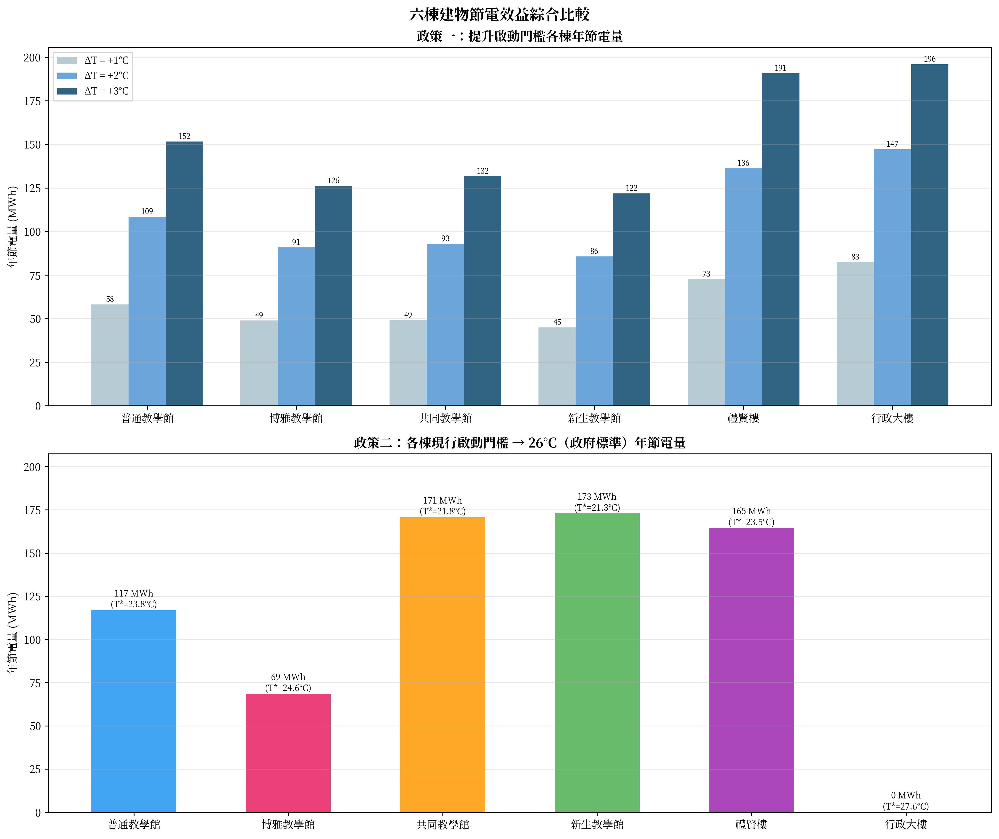

In [60]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(13, 11), dpi=300)

# ── 上圖：政策一（ΔT = 1, 2, 3）各棟並排長條 ──────────────────────────
x = np.arange(n_bldg)
bar_width = 0.25
delta_colors = {1: '#aec6cf', 2: '#5b9bd5', 3: '#1a5276'}

for i, dt in enumerate(DELTA_LIST):
    sub = df_savings[df_savings['提升ΔT(°C)'] == dt]
    values = [sub.loc[sub['棟別']==n, '年節電量(kWh)'].values[0] / 1000 for n in bldg_list]
    offset = (i - 1) * bar_width
    bars = ax1.bar(x + offset, values, bar_width,
                   color=delta_colors[dt], alpha=0.9, label=f'ΔT = +{dt}°C')
    for bar, val in zip(bars, values):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3,
                 f'{val:.0f}', ha='center', va='bottom', fontsize=7)

ax1.set_xticks(x)
ax1.set_xticklabels(bldg_list, fontsize=10)
ax1.set_ylabel('年節電量 (MWh)', fontsize=10)
ax1.set_title('政策一：提升啟動門檻各棟年節電量', fontsize=12, fontweight='bold')
ax1.legend(fontsize=9)
ax1.grid(axis='y', alpha=0.3)

# ── 下圖：政策二（調至 26°C）各棟 ─────────────────────────────────────
values2 = [df_p2.loc[df_p2['棟別']==n, '年節電量(kWh)'].values[0] / 1000 for n in bldg_list]
t_star  = [df_p2.loc[df_p2['棟別']==n, '現行 T*(°C)'].values[0] for n in bldg_list]

bars2 = ax2.bar(x, values2, 0.55,
                color=[bldg_colors[n] for n in bldg_list], alpha=0.85)
for bar, val, t in zip(bars2, values2, t_star):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3,
             f'{val:.0f} MWh\n(T*={t:.1f}°C)',
             ha='center', va='bottom', fontsize=8)

ax2.set_xticks(x)
ax2.set_xticklabels(bldg_list, fontsize=10)
ax2.set_ylabel('年節電量 (MWh)', fontsize=10)
ax2.set_ylim(0, max(values2) * 1.2)
ax2.set_title('政策二：各棟現行啟動門檻 → 26°C（政府標準）年節電量', fontsize=12, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

plt.suptitle('六棟建物節電效益綜合比較', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(CLEANED / 'report_savings_comparison.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

## 3-D 六棟節電效益彙整表

In [58]:
# 彙整表：各棟 T*、政策一(ΔT=2)、政策二
summary_rows = []
for name in bldg_list:
    ac_kw, kw_src = ac_kw_final[name]
    t_star = results[name]['下學期（2–6月）']['T_set']

    # 政策一 ΔT=2
    row_dt2 = df_savings[(df_savings['棟別'] == name) & (df_savings['提升ΔT(°C)'] == 2)].iloc[0]
    # 政策二
    row_p2  = df_p2[df_p2['棟別'] == name].iloc[0]

    summary_rows.append({
        '棟別': name,
        '空調負載(kW)': int(ac_kw),
        '下學期 T*(°C)': round(t_star, 1),
        '差距26°C': f"{26 - t_star:+.1f}°C",
        '政策一ΔT=2節電(MWh)': round(row_dt2['年節電量(kWh)'] / 1000, 1),
        '政策一ΔT=2節費(萬元)': round(row_dt2['年節費(萬元)'], 1),
        '政策二節電(MWh)': round(row_p2['年節電量(kWh)'] / 1000, 1),
        '政策二節費(萬元)': round(row_p2['年節費(萬元)'], 1),
    })

df_summary = pd.DataFrame(summary_rows)

print('=== 六棟節電效益彙整表 ===')
print(df_summary.to_string(index=False))
print()

# 合計行
p1_total_mwh = df_summary['政策一ΔT=2節電(MWh)'].sum()
p1_total_cost = df_summary['政策一ΔT=2節費(萬元)'].sum()
p2_total_mwh = df_summary['政策二節電(MWh)'].sum()
p2_total_cost = df_summary['政策二節費(萬元)'].sum()

print(f'六棟合計 政策一(ΔT=2)：{p1_total_mwh:.1f} MWh/yr  {p1_total_cost:.1f} 萬元/yr')
print(f'六棟合計 政策二(→26°C)：{p2_total_mwh:.1f} MWh/yr  {p2_total_cost:.1f} 萬元/yr')

=== 六棟節電效益彙整表 ===
   棟別  空調負載(kW)  下學期 T*(°C) 差距26°C  政策一ΔT=2節電(MWh)  政策一ΔT=2節費(萬元)  政策二節電(MWh)  政策二節費(萬元)
普通教學館       119        23.8 +2.2°C           108.6           38.0       116.9       40.9
博雅教學館        94        24.6 +1.4°C            90.9           31.8        68.5       24.0
共同教學館       118        21.8 +4.2°C            93.0           32.6       170.8       59.8
新生教學館       113        21.3 +4.7°C            85.7           30.0       172.9       60.5
  禮賢樓       153        23.5 +2.5°C           136.3           47.7       164.6       57.6
 行政大樓       116        27.6 -1.6°C           147.2           51.5         0.0        0.0

六棟合計 政策一(ΔT=2)：661.7 MWh/yr  231.6 萬元/yr
六棟合計 政策二(→26°C)：693.7 MWh/yr  242.8 萬元/yr


## 3-E 設定溫度效果分解：停機節電 vs 降低冷卻強度

Policy 2（T* → 26°C）的節電效益實際上包含**兩個不同機制**：

| 效果 | 說明 | CDH 計算 |
|---|---|---|
| **停機節電**（小時效果）| 氣溫落在 T\* 到 26°C 之間的小時，原本開機，現在不再啟動 | $\sum_{T^* < T_{\text{out}} < 26}\!(T_{\text{out}} - T^*)$ |
| **降低冷卻強度**（設定溫度效果）| 氣溫超過 26°C 的小時仍開機，但冷卻目標從 T\* 升到 26°C，每小時省 $(26 - T^*)$ | $n_{\text{hrs},T>26} \times (26 - T^*)$ |

$$\underbrace{\mathrm{CDH}_{\text{base}} - \mathrm{CDH}_{26}}_{\text{Policy 2 總節電}} = \underbrace{\sum_{T^* < T < 26}(T - T^*)}_{\text{停機節電}} + \underbrace{n_{T>26} \times (26 - T^*)}_{\text{降低冷卻強度}}$$

> **直覺說明：** 把冷氣設定從 24°C 調到 26°C，省電的原因有兩個：(1) 天氣沒那麼熱的時候根本不用開了；(2) 天氣很熱還是要開，但每小時只要冷卻 2°C 的差距，而不是 4°C。

=== Policy 2 節電效果分解（停機節電 vs 降低冷卻強度）===
   棟別  現行 T*(°C) 停機節電比例 降低強度節電比例 合計節電比例  停機節電(MWh)  降低強度節電(MWh)  合計節電(MWh)
普通教學館       23.8   6.0%    35.0%  41.0%       17.1         99.8      116.9
博雅教學館       24.6   3.0%    27.4%  30.5%        6.8         61.7       68.5
共同教學館       21.8  15.4%    45.1%  60.5%       43.5        127.3      170.8
新生教學館       21.3  17.7%    46.2%  63.9%       48.0        125.0      172.9
  禮賢樓       23.5   7.4%    37.5%  44.9%       27.2        137.4      164.6
 行政大樓       27.6   0.0%     0.0%   0.0%        0.0          0.0        0.0

六棟合計  停機節電：142.6 MWh/yr（21%）  降低強度節電：551.2 MWh/yr（79%）


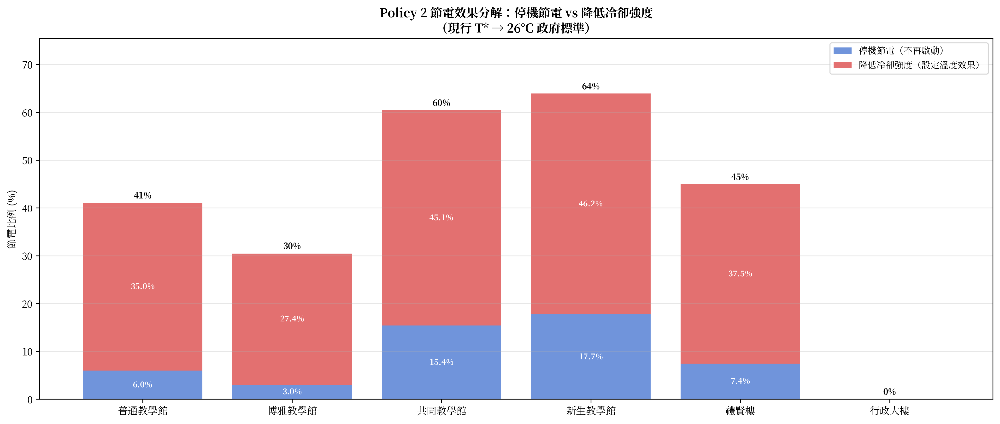

In [63]:
TARGET_T = 26.0

decomp_rows = []
for name in bldg_list:
    ac_kw, _ = ac_kw_final[name]
    t0 = results[name]['下學期（2–6月）']['T_set']

    CDH_base = (T_ops - t0).clip(min=0).sum() / n_years
    if CDH_base <= 0:
        continue

    # ── 停機節電：t0 < T < 26 的小時，原本開機現在關掉 ──────────────────
    hrs_mask   = (T_ops > t0) & (T_ops < TARGET_T)
    cdh_hours  = (T_ops[hrs_mask] - t0).sum() / n_years

    # ── 降低冷卻強度：T > 26 的小時，每小時少冷 (26 - t0)°C ─────────────
    hrs_above  = (T_ops >= TARGET_T).sum() / n_years  # hr/yr; >= to handle T==26.0 boundary
    cdh_intens = max(0, TARGET_T - t0) * hrs_above           # °C·hr/yr

    # 驗算：cdh_hours + cdh_intens ≈ CDH_base - CDH_26
    CDH_26   = (T_ops - TARGET_T).clip(min=0).sum() / n_years

    sf_hours  = cdh_hours  / CDH_base
    sf_intens = cdh_intens / CDH_base
    sf_total  = sf_hours + sf_intens   # == Policy 2 saving fraction

    kwh_hours  = ac_kw * sf_hours  * hrs_ops
    kwh_intens = ac_kw * sf_intens * hrs_ops
    kwh_total  = kwh_hours + kwh_intens

    decomp_rows.append({
        '棟別': name,
        '現行 T*(°C)': round(t0, 1),
        '停機節電比例': sf_hours,
        '降低強度節電比例': sf_intens,
        '合計節電比例': sf_total,
        '停機節電(MWh)': round(kwh_hours / 1000, 1),
        '降低強度節電(MWh)': round(kwh_intens / 1000, 1),
        '合計節電(MWh)': round(kwh_total / 1000, 1),
        '停機節費(萬元)': round(kwh_hours * TARIFF / 1e4, 1),
        '降低強度節費(萬元)': round(kwh_intens * TARIFF / 1e4, 1),
    })

df_decomp_eff = pd.DataFrame(decomp_rows)

# 列印
print('=== Policy 2 節電效果分解（停機節電 vs 降低冷卻強度）===')
cols_print = ['棟別','現行 T*(°C)','停機節電比例','降低強度節電比例','合計節電比例',
              '停機節電(MWh)','降低強度節電(MWh)','合計節電(MWh)']
df_print = df_decomp_eff[cols_print].copy()
for c in ['停機節電比例','降低強度節電比例','合計節電比例']:
    df_print[c] = df_print[c].map('{:.1%}'.format)
print(df_print.to_string(index=False))

total_h = df_decomp_eff['停機節電(MWh)'].sum()
total_i = df_decomp_eff['降低強度節電(MWh)'].sum()
print(f'\n六棟合計  停機節電：{total_h:.1f} MWh/yr（{total_h/(total_h+total_i):.0%}）'
      f'  降低強度節電：{total_i:.1f} MWh/yr（{total_i/(total_h+total_i):.0%}）')

fig, ax = plt.subplots(figsize=(14, 6), dpi=300)

x = np.arange(n_bldg)
color_h = '#5C85D6'
color_i = '#E05C5C'

vals_h = df_decomp_eff['停機節電比例'].values * 100
vals_i = df_decomp_eff['降低強度節電比例'].values * 100

bars_h = ax.bar(x, vals_h, color=color_h, alpha=0.88, label='停機節電（不再啟動）')
bars_i = ax.bar(x, vals_i, bottom=vals_h, color=color_i, alpha=0.88, label='降低冷卻強度（設定溫度效果）')

for bar, val, bot in zip(bars_i, vals_i, vals_h):
    if val >= 3:
        ax.text(bar.get_x() + bar.get_width()/2, bot + val/2,
                f'{val:.1f}%', ha='center', va='center',
                fontsize=8, fontweight='bold', color='white')
for bar, val in zip(bars_h, vals_h):
    if val >= 3:
        ax.text(bar.get_x() + bar.get_width()/2, val/2,
                f'{val:.1f}%', ha='center', va='center',
                fontsize=8, fontweight='bold', color='white')

totals = vals_h + vals_i
for i, tot in enumerate(totals):
    ax.text(i, tot + 0.5, f'{tot:.0f}%',
            ha='center', va='bottom', fontsize=8.5, fontweight='bold')

ax.set_xticks(x)
ax.set_xticklabels(bldg_list, fontsize=10)
ax.set_ylabel('節電比例 (%)', fontsize=10)
ax.set_ylim(0, totals.max() * 1.18)
ax.set_title('Policy 2 節電效果分解：停機節電 vs 降低冷卻強度\n（現行 T* → 26°C 政府標準）',
             fontsize=12, fontweight='bold')
ax.legend(fontsize=9, loc='upper right')
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig(CLEANED / 'report_effect_decomposition.png', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

---
## 3-E 結論與政策建議
---

### 一、主要發現

| 類型 | 代表棟 | 下學期 T* | 與 26°C 差距 | 行為解讀 |
|---|---|---|---|---|
| 教學館（普通、博雅） | 普通、博雅 | ~24°C | +2°C | 在氣溫達標前約 2°C 已開機 |
| 教學館（共同、新生） | 共同、新生 | ~21–22°C | +4–5°C | 更早開機，節電潛力更大 |
| 非教學建物 | 禮賢、行政 | 見上方結果 | 視結果而定 | 行政空間是否有不同設定行為？ |

### 二、治理缺口（核心論點）

- NTU 有採購規範（依房間面積限制空調容量），但**無使用規範**（無強制設定溫度或開機門檻）。
- 各棟各自為政，拐點差異最大達 4–5°C，說明缺乏統一標準。
- 建立全校統一的冷氣使用規範（治理框架）是系統性節電的先決條件。

### 三、政策優先順序建議

| 優先序 | 政策 | 難易度 | 效益 |
|---|---|---|---|
| 1 | 訂定全校空調使用規範（26°C 室內標準）| 中（行政程序）| 最高（系統性）|
| 2 | T* 低於 22°C 的建物優先加裝智慧溫控 | 低（技術成熟）| 高（針對偏差棟）|
| 3 | 分學期啟動門檻最佳化（春季嚴格、秋季放寬）| 低（可程式化）| 中（精細化調控）|

---
## 3-F 後續研究精進方向
---

1. **引入回風溫度與外氣溫度差值**：現有分析以台大提供的外氣溫度作為輸入，然而各棟建築位置不同、換氣口設置位置亦有差異，導致實際換氣口溫度與外氣溫度資料之間可能存在明顯落差。若能取得回風溫度與外氣溫度的差值作為特徵，預期可提升模型的準確度。

2. **納入館舍功能差異**：不同館舍的用電型態未必相同。以設有冰箱的館舍為例，其基礎負載主要來自冰箱設備，與純教學空間的用電結構存在本質差異。後續分析應針對館舍功能進行分類，避免混用不同用電型態的資料影響模型表現。

3. **改用 Eigen factor 與 Eigen value 進行用電分解**：用電分解所得的各成分加總不等於總用電量，若直接以分解結果建模，將導致計算誤差。應改採 Eigen factor 與 Eigen value 的方式進行分析，以確保數學一致性。

4. **細化 Calendar 特徵的分類與拆分**：現有 Calendar 資料的粒度可能不足以捕捉用電行為的細微變化，導致模型 R² 偏低。建議進一步將行事曆資料拆分為更細緻的子類別（如上課日、考試週、假期類型等），以提供模型更具區辨力的時間特徵。

5. **處理 Linear Regression 的 Overfitting 問題**：當特徵數量增加或資料量有限時，線性回歸模型容易發生 overfitting，使模型在訓練集表現良好但泛化能力不足。建議透過交叉驗證、正則化（如 Ridge、Lasso）或特徵篩選等方式評估並控制 overfitting 的風險。
